In [3]:
!pip3 install scipy

     |████████████████████████████████| 42.1 MB 210 kB/s eta 0:00:012    |██████████▉                     | 14.2 MB 8.3 MB/s eta 0:00:04
     |████████████████████████████████| 16.8 MB 31.1 MB/s eta 0:00:01    |███▎                            | 1.7 MB 41.7 MB/s eta 0:00:01


In [2]:
import sys
sys.executable

'/usr/bin/python3'

In [6]:
!/usr/bin/python3 -m pip install scipy

  Using cached scipy-1.8.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (42.1 MB)


In [1]:
import cv2
import numpy as np
from scipy import ndimage

## HPF Filters

Examining a region and boosting the intensity of certain pixels depending the intensity of the surrounding pixels

In [26]:
kernel_3x3 = np.array([[-1,-1,-1], [-1,8,-1],[-1,-1,-1]])
img = cv2.imread("./eye.jpg", 0) #image as black and white

In [17]:
kernel_5x5 = np.array([[-1, -1, -1, -1, -1],                        
                       [-1, 1, 2, 1, -1],                        
                       [-1, 2, 4, 2, -1],                        
                       [-1, 1, 2, 1, -1],
                       [-1, -1, -1, -1, -1]])  

Convolving the image 

In [18]:
k3 = ndimage.convolve(img, kernel_3x3)
k5 = ndimage.convolve(img, kernel_5x5)

In [ ]:
cv2.imshow('original',img)
cv2.imshow('k3 convolved',k3)
cv2.imshow('k5 convolved', k5)
cv2.waitKey()
cv2.destroyAllWindows()

To improve edge detection, as edge-finding filters tend to detect noise as edges, we apply blurring to the image first

In [3]:
def strokeEdges(src, dst, blurKsize = 7, edgeKsize=5):
    if blurKsize >=3:
        blurredSrc = cv2.medianBlur(src, blurKsize)
        graySrc = cv2.cvtColor(blurredSrc, cv2.COLOR_BGR2GRAY)
    else:
        graySrc = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY) #it doesnt make sense to apply the blur in this case
    cv2.Laplacian(graySrc, cv2.CV_8U, graySrc, ksize= edgeKsize) # laplacian filter to detect edges
    normalizedInverseAlpha = (1.0 / 255)*(255-graySrc) # This will take every value of the gray image, invert the color, and then, convert it into a value between 1 and 0
    channels = cv2.split(src)
    for channel in channels:
        channel[:] = channel * normalizedInverseAlpha # this will decrease intensity of values, because we are multiplying for values in he range [0-1]
    cv2.merge(channels, dst)
    

In [2]:
img  = cv2.imread('./ridge.jpg', 3) #image with color
dest = img.copy()


In [22]:
strokeEdges(img, dest, blurKsize = 1)

In [ ]:
cv2.imshow('original',img)
cv2.imshow('after strokeEdges',dest)
cv2.waitKey()
cv2.destroyAllWindows()

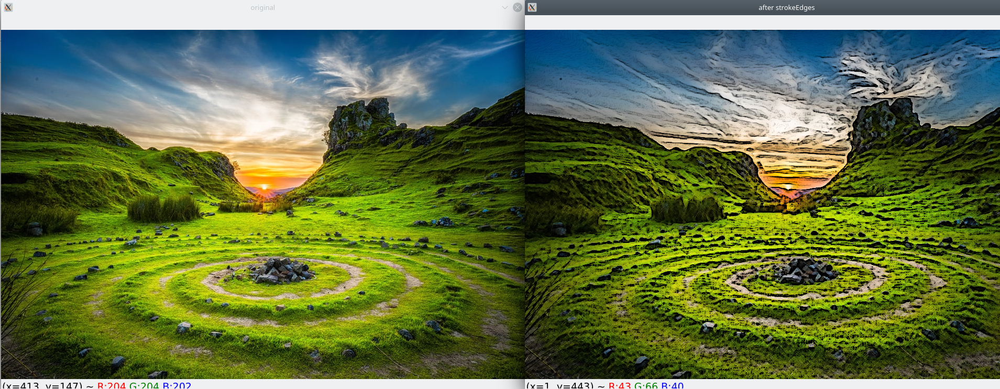

Disabling the blur, we get this:

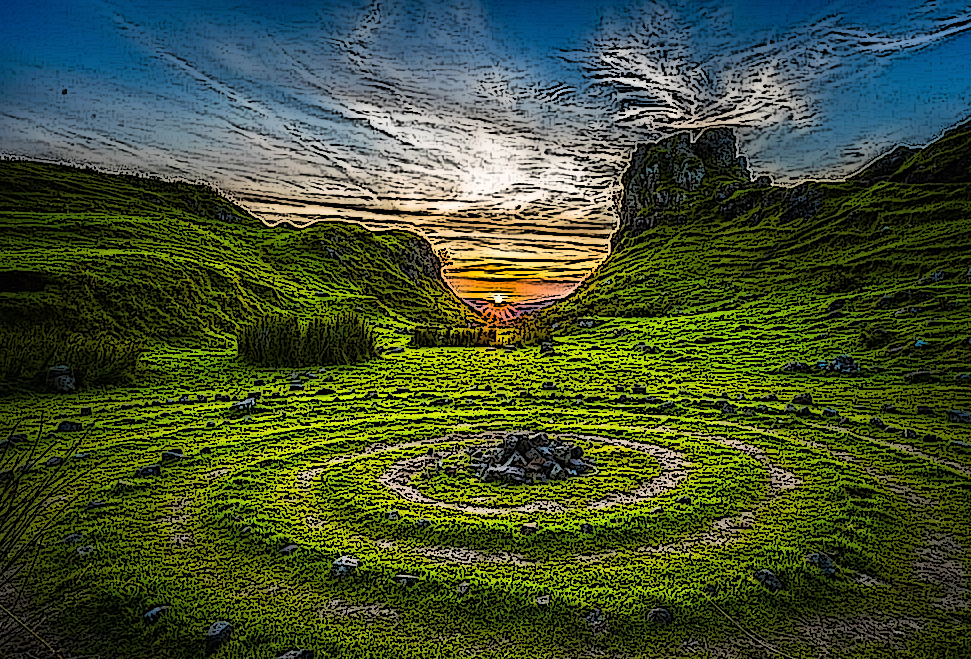

### Using filter2D() to apply convolutions 

In [9]:
img  = cv2.imread('./ridge.jpg', 3) #image with color
dest = img.copy()

In [10]:
kernel = np.array([[-1,-1,-1],
                      [-1,9,-1],
                      [-1,-1,-1]])
cv2.filter2D(img, -1, kernel, dest)

array([[[112,  52,   0],
        [110,  50,   0],
        [107,  47,   0],
        ...,
        [118,  57,   0],
        [127,  66,   3],
        [126,  65,   2]],

       [[110,  50,   0],
        [109,  49,   0],
        [116,  56,   4],
        ...,
        [135,  81,   7],
        [134,  80,   6],
        [133,  79,   5]],

       [[107,  47,   0],
        [116,  56,   4],
        [113,  53,   1],
        ...,
        [134,  84,   0],
        [134,  84,   0],
        [134,  84,   0]],

       ...,

       [[ 85, 121, 112],
        [ 13,  53,  43],
        [  0,  14,   2],
        ...,
        [  0,  11,   3],
        [  0,   0,   0],
        [  0,  18,  23]],

       [[  0,  17,  11],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,  25,   8],
        [  0,   0,   0],
        [  0,  24,  18]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   2,   2],
        ...,
        [ 15,   8,   0],
        [  0,   0,   0],
        [  0,   7,  11]]

In [11]:
cv2.imshow('original',img)
cv2.imshow('after filter2D',dest)
cv2.waitKey()
cv2.destroyAllWindows()

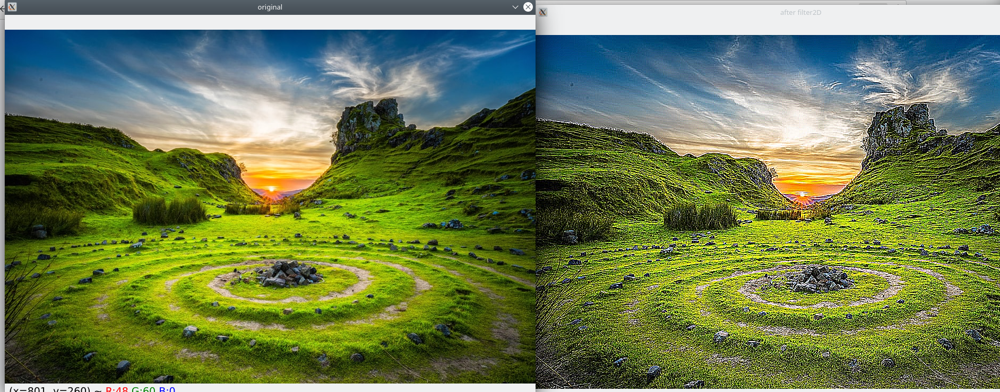

### Canny algorithm for border detection

In [14]:
newspaper = cv2.imread('20000120.jpg',3)
newspaper_borders = cv2.Canny(newspaper, 100,200)
cv2.imshow('newspaper', newspaper)
cv2.imshow('newspaper borders',newspaper_borders)
cv2.waitKey()
cv2.destroyAllWindows()

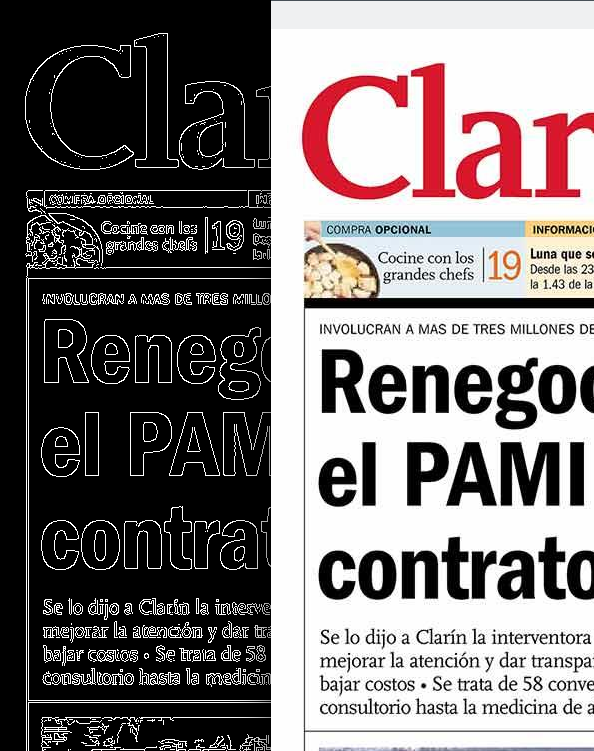

### Contour detection

Getting a rectangular region that we are interested in

In [17]:
newspaper = cv2.imread('20000120.jpg', 0)
newspaper_copy = newspaper.copy()
#second value determines value where to draw a line between black and white, third value is max, and 0 is THRESH_BINARY, meaning the resulting image will be just 255 or 0
ret, thresh = cv2.threshold(newspaper, 127, 255, 0)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
color = cv2.cvtColor(newspaper_copy, cv2.COLOR_GRAY2BGR) #we give back colors to the image so that we can draw on it
newspaper_copy = cv2.drawContours(image = color, contours = contours, contourIdx=-1, color=(0,255,0),thickness=2) #we draw green boxes of the contours. 

In [18]:
cv2.imshow('contours', newspaper_copy)
cv2.waitKey(0)
cv2.destroyAllWindows()

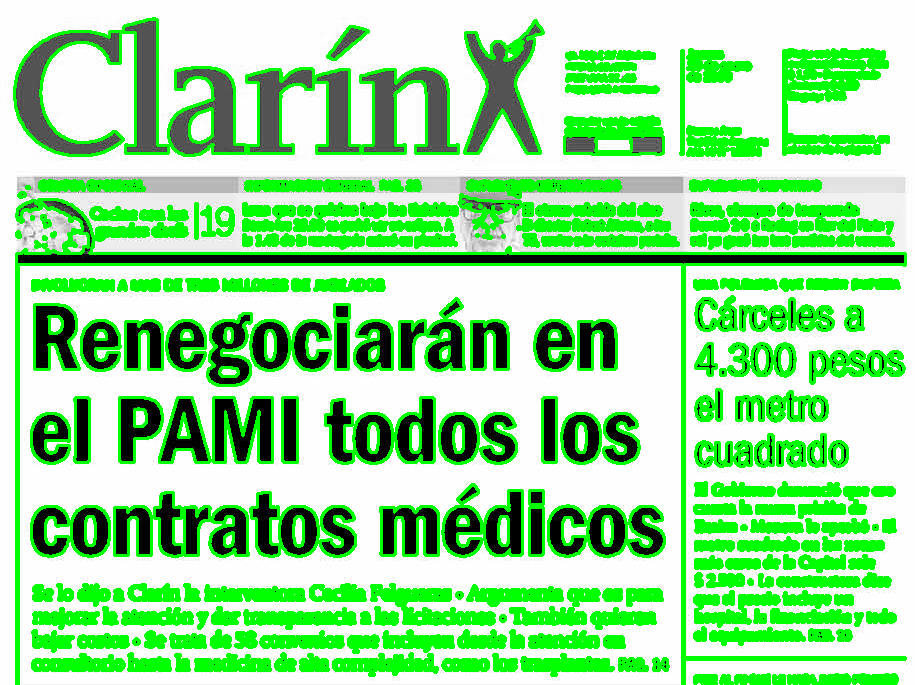

## Bounding Box

Get a bounding box around an object

In [15]:
img = cv2.pyrDown(cv2.imread("20000120.jpg", cv2.IMREAD_UNCHANGED))
ret, thresh = cv2.threshold(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
#contours, hier = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours, hier = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single 
#bounding box possible


## now we enclose the contours

for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(img, (x,y), (x+w, y+h), (0,255,0),2)
    # we calculate the minimum area
    rect = cv2.minAreaRect(c)
    #calculate coordinates of the minimum area rectangle
    box = cv2.boxPoints(rect)
    #we normalize the coordinates
    #box = np.int(box)
    cv2.drawContours(img, [box.astype(int)], 0, (0,0,255),3)
    
cv2.imshow('contours', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Draw rectangles around biggest areas

Strategy 1: Using Canny to detect borders first, then apply findContours

In [9]:
img = cv2.pyrDown(cv2.imread("20171009.jpg", cv2.IMREAD_UNCHANGED))
newspaper_borders = cv2.Canny(img, 255,255)
ret, thresh = cv2.threshold(newspaper_borders, 127, 255, cv2.THRESH_BINARY)
#ret, thresh = cv2.threshold(cv2.cvtColor(newspaper_borders, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
contours, hier = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single
areas = [[index, cv2.contourArea(c)] for index, c in enumerate(contours)]
sorted_areas = sorted(areas, key = lambda x: x[1], reverse=True)
for i in range(0,10):
    x,y,w,h = cv2.boundingRect(contours[sorted_areas[i][0]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (0,0,255),5)
#cv2.drawContours(image = img, contours = contours, contourIdx = 1, color= (0,0,255),thickness=3, hierarchy = hier, maxLevel=3)

cv2.imshow('contours', img)
cv2.waitKey(0)
cv2.destroyAllWindows()


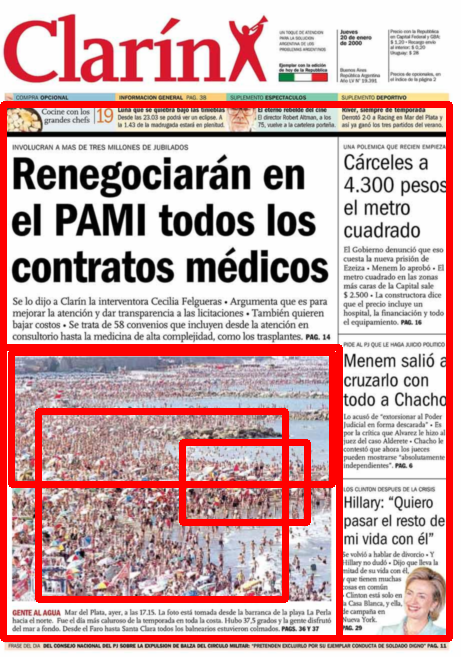

The image seems to trigger the algorithm, finding borders

Strategy 2: Without Canny and without downsampling, augmenting threshold to try to avoid images

In [19]:
img = cv2.imread("20220301.jpg", cv2.IMREAD_GRAYSCALE)
ret, thresh = cv2.threshold(img, 230, 255, cv2.THRESH_BINARY)
#ret, thresh = cv2.threshold(cv2.cvtColor(newspaper_borders, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
contours, hier = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single
areas = [[index, cv2.contourArea(c)] for index, c in enumerate(contours)]
sorted_areas = sorted(areas, key = lambda x: x[1], reverse=True)
for i in range(100,200):
    x,y,w,h = cv2.boundingRect(contours[sorted_areas[i][0]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (0,0,255),5)
#cv2.drawContours(image = img, contours = contours, contourIdx = 1, color= (0,0,255),thickness=3, hierarchy = hier, maxLevel=3)

cv2.imshow('contours', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

Not really good either. Let's try using the negative of the image

In [26]:
img = cv2.imread("20000103.jpg", cv2.IMREAD_GRAYSCALE)
ret, thresh = cv2.threshold(img, 230, 255, cv2.THRESH_BINARY)
#ret, thresh = cv2.threshold(cv2.cvtColor(newspaper_borders, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
contours, hier = cv2.findContours(~thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single
areas = [[index, cv2.contourArea(c)] for index, c in enumerate(contours)]
sorted_areas = sorted(areas, key = lambda x: x[1], reverse=True)
for i in range(0,20):
    x,y,w,h = cv2.boundingRect(contours[sorted_areas[i][0]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (0,0,255),5)
#cv2.drawContours(image = img, contours = contours, contourIdx = 1, color= (0,0,255),thickness=3, hierarchy = hier, maxLevel=3)

cv2.imshow('contours', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

This one gives us a fairly good squares around main areas. However, it is yet not ideal. Now let's try with otsu thresholding

In [31]:
img = cv2.imread("20040521.jpg", cv2.IMREAD_GRAYSCALE)
ret, thresh = cv2.threshold(img, 170, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
#ret, thresh = cv2.threshold(cv2.cvtColor(newspaper_borders, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
contours, hier = cv2.findContours(~thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single
areas = [[index, cv2.contourArea(c)] for index, c in enumerate(contours)]
sorted_areas = sorted(areas, key = lambda x: x[1], reverse=True)
for i in range(0,20):
    x,y,w,h = cv2.boundingRect(contours[sorted_areas[i][0]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (0,0,255),5)
#cv2.drawContours(image = img, contours = contours, contourIdx = 1, color= (0,0,255),thickness=3, hierarchy = hier, maxLevel=3)

cv2.imshow('contours', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [28]:
!pip3 install pytesseract

  Using cached pytesseract-0.3.9-py2.py3-none-any.whl (14 kB)
  Using cached packaging-21.3-py3-none-any.whl (40 kB)
     |████████████████████████████████| 4.3 MB 1.8 MB/s eta 0:00:01
  Using cached pyparsing-3.0.7-py3-none-any.whl (98 kB)


Trying RLSA now, to make mask of sections of text first

In [2]:
from pythonRLSA import rlsa
import math
import pytesseract

In [56]:
img = cv2.imread("20040521.jpg", cv2.IMREAD_GRAYSCALE)
ret, thresh = cv2.threshold(img, 170, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

# we create a mask, blank image of same dimension as original
mask = np.ones(img.shape[:2], dtype="uint8")
x, y =mask.shape

value = max(math.ceil(x/100), math.ceil(y/100)) + 20 #no idea
mask = rlsa.rlsa(thresh, True, True, 20)

In [58]:
cv2.imshow('img',img)
cv2.imshow('mask', mask)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
cv2.destroyAllWindows()

New approach, remove lines first, then apply image heuristics to remove images, looking for biggest areas. Then, apply rlsa to make a mask for detecting text. Detect big areas again and this should hopefully be the title

In [53]:
img = cv2.pyrDown(cv2.imread("5.jpg", cv2.IMREAD_UNCHANGED))


In [37]:
img = cv2.imread("1.jpg") 

In [38]:
## removing 20% top
height = img.shape[0]
header_size = int(height/5)
img = img[header_size:,:,:]

In [39]:
## detecting lines

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 255, 255)
minLineLength = 150
maxLineGap = 3
lines = cv2.HoughLinesP(image=edges, rho=1, theta=np.pi/180.0, threshold=10, 
                        minLineLength = minLineLength, 
                        maxLineGap = maxLineGap)
for elem in lines:
    for x1, y1, x2, y2 in elem:
        cv2.line(img, (x1,y1), (x2, y2), (255, 255,255), 3)



In [40]:
## remove main image looking for biggest areas
gray_no_lines = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray_no_lines, 230, 255, cv2.THRESH_BINARY)
#ret, thresh = cv2.threshold(cv2.cvtColor(newspaper_borders, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
contours, hier = cv2.findContours(~thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single
areas = [[index, cv2.contourArea(c)] for index, c in enumerate(contours)]
sorted_areas = sorted(areas, key = lambda x: x[1], reverse=True)
for i in range(0,2):
    x,y,w,h = cv2.boundingRect(contours[sorted_areas[i][0]])
    cv2.rectangle(img, (x,y), (x+w, y+h), (255,255,255),-1)
likely_img_pos = contours[sorted_areas[0][0]] #saving just in case we need it later


In [41]:
# get contours with biggest height
gray_no_lines = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray_no_lines, 120, 255, cv2.THRESH_BINARY)
#ret, thresh = cv2.threshold(cv2.cvtColor(newspaper_borders, cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)
contours, hier = cv2.findContours(~thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) #Important, external will give you only an external bounding box. Tree will give you every single
heights = [[index, cv2.boundingRect(c)[3]] for index, c in enumerate(contours) if cv2.boundingRect(c)[3]> 2]
heights_only = [elem[1] for elem in heights]

heights_only_np = np.array(heights_only)
q3 = np.quantile(heights_only_np, 0.93)
sorted_heights = sorted(heights, key = lambda x: x[1], reverse=True)
#calculate average height
avg_height = 0
for pair in sorted_heights:
    avg_height +=pair[1]
avg_height = avg_height/len(sorted_heights)

#draw boxes for each letter
# save the boxes
letter_boxes = []
for i in range(0,len(sorted_heights)):
    if sorted_heights[i][1] > q3:
        x,y,w,h = cv2.boundingRect(contours[sorted_heights[i][0]])
        letter_boxes.append([x,y,w,h])
        
#likely_img_pos = contours[sorted_areas[0][0]] #saving just in case we need it later

In [15]:
avg_area

673.8536585365854

In [16]:
std

446.1590310900368

In [8]:
import matplotlib.pyplot as plt

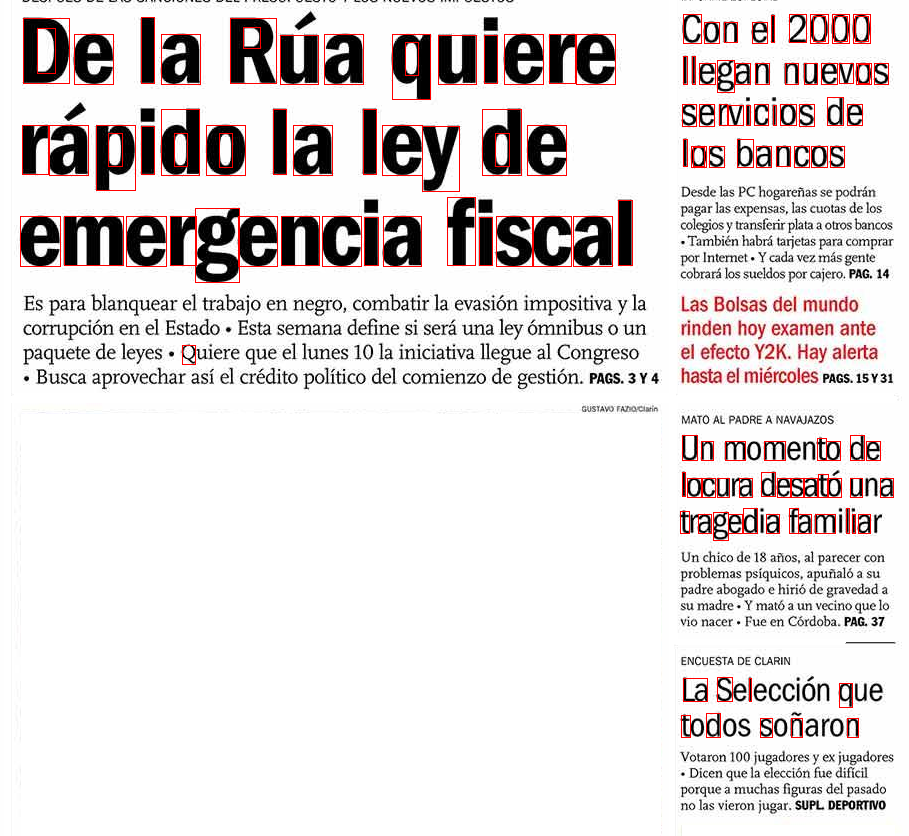

Now we integrate boxes in an horizontal way. To do this, we look for boxes with similar y+h values (variation of a half box down, a cuarter of box up.). The separation between x_i and x_j cannot be bigger than the size of the original w. Then, if all this factors are there, we add up the boxes, and we do the analyisis with the new border of the new box, but using the same values of w for checking new boxes.

Every time a box is added, we delete it of the boxes to treat, to reduce the search space
To pick a good box to start, I am going to look for the box more to the left that has at least another four boxes at the same height


In [225]:
#for coords in letter_boxes:
#    x,y,w,h = coords
#    cv2.rectangle(img, (x,y), (x+w, y+h), (255,0,0),1)

In [42]:
## eliminate boxes inside boxes
for coords in letter_boxes:
    x, y, w, h = coords
    i = 0
    for other_coords in letter_boxes:
        x2,y2,w2,h2 = other_coords
        if x < x2 and y < y2 and x+w > x2+w2 and y+h > y2+h2:
            print(coords, other_coords)
            letter_boxes[i] = [-1,-1,-1,-1]
        i+=1
letter_boxes[:] = [elem for elem in letter_boxes if elem[0] != -1]

[508, 144, 39, 66] [521, 168, 14, 33]
[187, 144, 38, 66] [200, 168, 13, 33]
[122, 160, 39, 65] [134, 168, 14, 33]
[418, 69, 38, 65] [431, 77, 13, 33]
[256, 53, 46, 65] [269, 62, 17, 21]
[49, 53, 46, 65] [63, 63, 18, 45]
[232, 160, 39, 50] [245, 168, 13, 34]
[167, 931, 17, 33] [169, 933, 12, 21]
[879, 49, 17, 29] [881, 51, 13, 25]
[858, 49, 17, 29] [860, 51, 13, 25]
[836, 49, 18, 29] [839, 51, 12, 25]
[600, 931, 18, 25] [603, 933, 12, 21]
[431, 931, 18, 25] [434, 933, 12, 21]


In [43]:
#drop boxes with small areas now out of letter_boxes
avg_area = 0
areas = []
for coords in letter_boxes:
    area = coords[2]*coords[3]
    avg_area += area
    areas.append(area)
avg_area /= len(areas)
areas_array = np.array(areas)
std = np.std(areas_array)
letter_boxes[:] = [coords for coords in letter_boxes if coords[2]*coords[3] > avg_area]

    


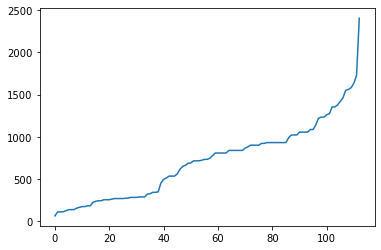

In [25]:
plt.plot(sorted(areas_array))

In [26]:
for coords in letter_boxes:
    x,y,w,h = coords
    cv2.rectangle(img, (x,y), (x+w, y+h), (0,0,255),1)

In [44]:

line_boxes = []
while letter_boxes != []:
    comp_box = letter_boxes[0]
    original_width = comp_box[2]
    original_height = comp_box[3]
    letter_boxes.pop(0)
    #create the new line box
    for coords in letter_boxes:
        # if vertical position + height is similar, then most likely belongs to the same phrase
        
        if abs(coords[1]+coords[3] - (comp_box[1]+comp_box[3])) < 10:
            
            #if the x of the possible added box is less than the x of our comp_box, it is at our left
            if coords[0] < comp_box[0]:
                
                #space analysis
                #if (coords[0]+coords[2] - comp_box[0]) < original_width + 20: # this might fail with spaces between words if the chosen letter is too small
                comp_box[2] = coords[2] + (-(coords[0] + coords[2]) + comp_box[0]) + comp_box[2] #w new box + gap + w old box
                comp_box[0] = coords[0] # correcting x
                comp_box[1] =  min(coords[1], comp_box[1])# for capital letters, some might be taller than others.
                comp_box[3] = max(coords[3],comp_box[3])
            if coords[0] > (comp_box[0]+ comp_box[2]): # the new possible box is at the right:
                
                #print(comp_box, coords)
                #if (coords[0] - (comp_box[0] + comp_box[2])) < original_width + 20: # space check:
                    #update comp_box
                    # new w is orignial w + extra w + gap
                comp_box[2] += coords[2] + (coords[0] - (comp_box[0] + comp_box[2])) 
                # x doesnt change
                comp_box[1] = min(coords[1], comp_box[1]) #pick the smallest y and the heighest h
                comp_box[3] = max(coords[3], comp_box[3])
    # eliminate all boxes in the same height
    letter_boxes[:] = [coords for coords in letter_boxes if abs((comp_box[1]+comp_box[3]) - (coords[1]+ coords[3])) > 10]
    cv2.rectangle(img, (comp_box[0],comp_box[1]), (comp_box[0]+ comp_box[2], comp_box[1]+comp_box[3]), (0,255,0),2)       
    # add new line to line_list
    line_boxes.append(comp_box)



In [34]:
# here we apply rlsa
# we create a mask, blank image of same dimension as original
gray_no_lines = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cannied = cv2.Canny(gray_no_lines, 255,255)
ret, thresh = cv2.threshold(cannied, 245, 255, cv2.THRESH_BINARY)
mask = np.ones(img.shape[:2], dtype="uint8")
x, y =mask.shape

value = max(math.ceil(x/100), math.ceil(y/100)) + 20 #no idea
mask = rlsa.rlsa(~thresh, True, True, 5)

NameError: name 'math' is not defined

In [45]:
#cv2.imshow("edges", edges)
#cv2.imshow('cannied',cannied)
cv2.imshow('thresh', thresh)
cv2.imshow('img',img)
cv2.waitKey()
cv2.destroyAllWindows()

In [16]:
cv2.destroyAllWindows()